# Moran's I

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import stlearn as st
import scanpy as sc
import squidpy as sq
import warnings
import os

root = os.getcwd()
warnings.filterwarnings("ignore")

/Users/nomura/miniconda3/envs/scomv-pip-2/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
/Users/nomura/miniconda3/envs/scomv-pip-2/lib/python3.11/site-packages/stlearn/tl/cci/het.py:206: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit(parallel=True, nopython=False)


In [3]:
file_ = "../docs/tutorials/tutorial_data/xenium_data/"

In [4]:
adata = st.ReadXenium(feature_cell_matrix_file=f"{file_}/cell_feature_matrix.h5",
                      cell_summary_file=f"{file_}/cells.csv.gz",
                      library_id="Case7_After",
                      image_path=None,
                      scale=1,
                      spot_diameter_fullres=15 # Recommend
                     )

In [5]:
sc.pp.filter_genes(adata, min_counts=10)
sc.pp.filter_cells(adata,min_counts=10)

In [14]:
def make_moran_file(min_x, max_x, min_y, max_y, adata):

    save_root = f"{root}/moran_files/{min_x}_{max_x}_{min_y}_{max_y}"
    if not os.path.exists(save_root):
        os.makedirs(save_root)
    
    adata = adata[
    (adata.obs['imagecol'] >= min_x) & (adata.obs['imagecol'] <= max_x) &

    (adata.obs['imagerow'] >= min_y) & (adata.obs['imagerow'] <= max_y) 
    ]
    
    adata_subsample = sc.pp.subsample(adata, fraction=0.5, copy=True)
    sq.gr.spatial_neighbors(adata_subsample, coord_type="generic", delaunay=True)
    sq.gr.spatial_autocorr(
        adata_subsample,
        mode="moran",
        n_perms=100,
        n_jobs=1,
    )

    # Moran's I の値を取得して昇順に並べる
    I_values = adata_subsample.uns["moranI"]["I"]
    sorted_vals = np.sort(I_values)
    
    # 累積度数を計算（1からnまでをnで割って相対度数にする）
    cdf = np.arange(1, len(sorted_vals) + 1) / len(sorted_vals)
    
    # 折れ線グラフでプロット
    plt.figure(figsize=(6, 4))
    plt.plot(sorted_vals, cdf, color='steelblue', linewidth=2)
    
    plt.xlabel("Moran's I")
    plt.ylabel("Cumulative Frequency")
    plt.title("Cumulative Distribution of Moran's I (Line Plot)")
    plt.grid(True)
    plt.tight_layout()
    #plt.savefig(f"{save_root}/moran_fig.png")
    plt.show()

    # 1. moranI DataFrame の先頭50行を取得
    moran_df = adata_subsample.uns["moranI"]
    
    # 2. "I"列だけ抽出し、新しい DataFrame を作成
    I_df = moran_df[["I"]].copy()
    I_df.to_csv(f"{save_root}/moran.csv", index=True)  # indexも保存したい場合
    #moran_df.to_csv(f"{save_root}/moran_all.csv", index=True)  # 分散とかも

    return moran_df, adata, save_root



  0%|          | 0/100 [00:00<?, ?/s]

/Users/nomura/miniconda3/envs/scomv-pip-2/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
/Users/nomura/miniconda3/envs/scomv-pip-2/lib/python3.11/site-packages/numba/core/decorators.py:282: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


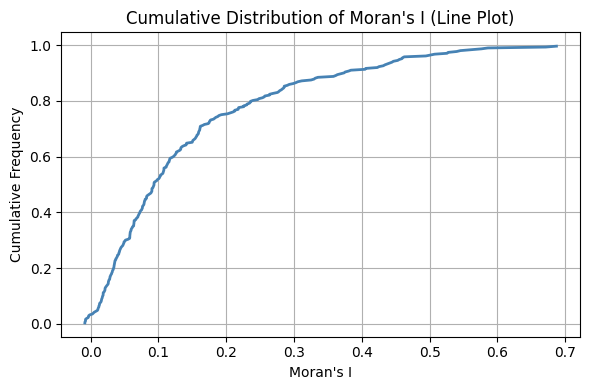

In [8]:
moran_df, adata_subsample, save_root = make_moran_file(2400, 3400, 2400, 3800, adata)

In [9]:
moran_df

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
KRT7,0.687049,0.000000,0.000124,0.000000,0.009901,0.000306,NaN,NaN,0.011563
TACSTD2,0.671252,0.000000,0.000124,0.000000,0.009901,0.000285,NaN,NaN,0.011563
KRT15,0.585993,0.000000,0.000124,0.000000,0.009901,0.000219,NaN,NaN,0.011563
SERPINA3,0.576531,0.000000,0.000124,0.000000,0.009901,0.000216,NaN,NaN,0.011563
DSP,0.561945,0.000000,0.000124,0.000000,0.009901,0.000251,NaN,NaN,0.011563
...,...,...,...,...,...,...,...,...,...
MYBPC1,-0.007423,0.263387,0.000124,0.151028,0.267327,0.000045,NaN,NaN,0.270787
KLRF1,-0.007480,0.261697,0.000124,0.169749,0.148515,0.000079,NaN,NaN,0.153416
CCL20,-0.008295,0.238484,0.000124,0.168191,0.089109,0.000062,NaN,NaN,0.093594
DNAAF1,-0.008419,0.235045,0.000124,0.171543,0.148515,0.000075,NaN,NaN,0.153416


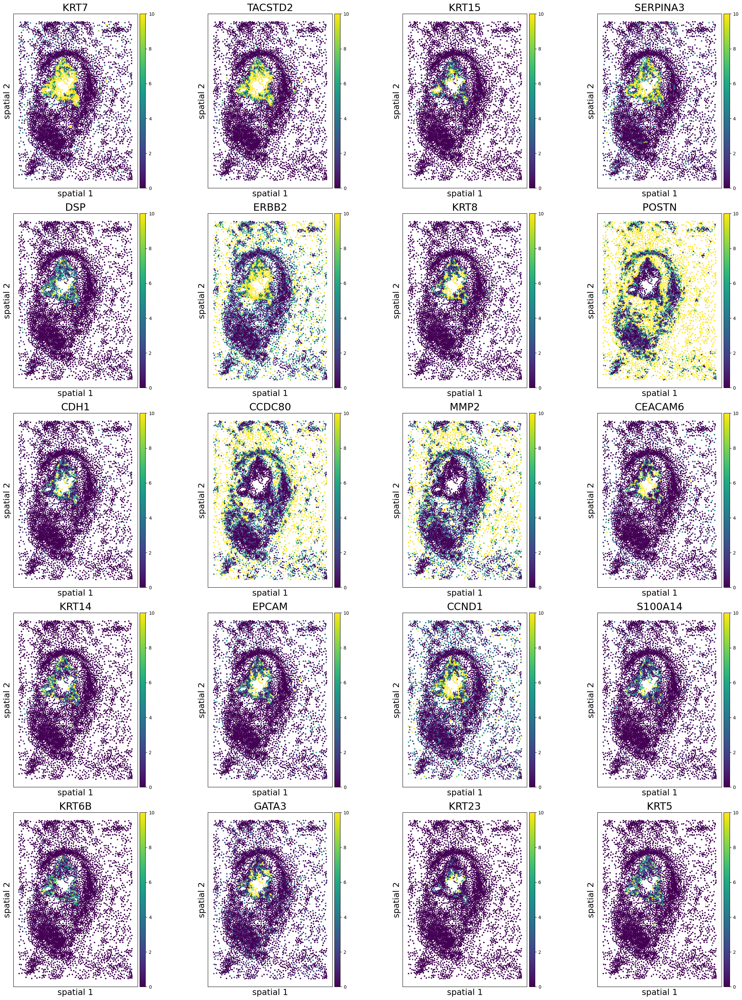

In [11]:
import matplotlib.pyplot as plt
import math
import squidpy as sq

top_genes = list(moran_df.index[0:20])

# 遺伝子数
n = len(top_genes)

# グリッドサイズ（例: 1列4つ → 4列）
n_cols = 4
n_rows = math.ceil(n / n_cols)

# Figure準備
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 6*n_rows))

# axes を1次元化（余った枠を扱いやすくする）
axes = axes.flatten()

for i, gene in enumerate(top_genes):
    ax = axes[i]

    # 各subplotに描画
    sq.pl.spatial_scatter(
        adata_subsample,
        library_id="spatial",
        color=gene,
        shape=None,
        size=15,
        img=False,
        vmin=0,
        vmax=10,
        ax=ax
    )
    
    ax.set_title(gene, fontsize=22)
    ax.set_xlabel("spatial 1", fontsize=18)
    ax.set_ylabel("spatial 2", fontsize=18)

# 残りの空白 subplot を非表示
for j in range(n, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
#plt.savefig(f"{save_root}/moran_top_distribution.png",
            #dpi=300, bbox_inches='tight')
plt.show()


# Geary' C

In [32]:
def make_geary_file(min_x, max_x, min_y, max_y, adata):

    save_root = f"{root}/moran_files/{min_x}_{max_x}_{min_y}_{max_y}"
    if not os.path.exists(save_root):
        os.makedirs(save_root)
    
    adata = adata[
    (adata.obs['imagecol'] >= min_x) & (adata.obs['imagecol'] <= max_x) &

    (adata.obs['imagerow'] >= min_y) & (adata.obs['imagerow'] <= max_y) 
    ]
    
    adata_subsample = sc.pp.subsample(adata, fraction=0.5, copy=True)
    sq.gr.spatial_neighbors(adata_subsample, coord_type="generic", delaunay=True)
    sq.gr.spatial_autocorr(
        adata_subsample,
        mode="geary",
        n_perms=100,
        n_jobs=1,
    )

    # geary's C の値を取得して昇順に並べる
    C_values = adata_subsample.uns["gearyC"]["C"]
    sorted_vals = np.sort(C_values)
    
    # 累積度数を計算（1からnまでをnで割って相対度数にする）
    cdf = np.arange(1, len(sorted_vals) + 1) / len(sorted_vals)
    
    # 折れ線グラフでプロット
    plt.figure(figsize=(6, 4))
    plt.plot(sorted_vals, cdf, color='steelblue', linewidth=2)
    
    plt.xlabel("Geary's C")
    plt.ylabel("Cumulative Frequency")
    plt.title("Cumulative Distribution of Geary's C (Line Plot)")
    plt.grid(True)
    plt.tight_layout()
    #plt.savefig(f"{save_root}/moran_fig.png")
    plt.show()

    # 1. moranI DataFrame の先頭50行を取得
    geary_df = adata_subsample.uns["gearyC"]
    
    # 2. "I"列だけ抽出し、新しい DataFrame を作成
    C_df = geary_df[["C"]].copy()
    C_df.to_csv(f"{save_root}/moran.csv", index=True)  # indexも保存したい場合
    moran_df.to_csv(f"{save_root}/moran_all.csv", index=True)

    return geary_df, adata, save_root



  0%|          | 0/100 [00:00<?, ?/s]

/Users/nomura/miniconda3/envs/scomv-pip-2/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
/Users/nomura/miniconda3/envs/scomv-pip-2/lib/python3.11/site-packages/numba/core/decorators.py:282: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)


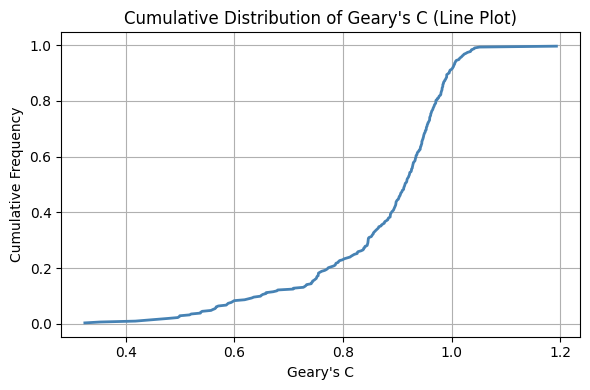

In [33]:
geary_df, adata_subsample, save_root = make_geary_file(2400, 3400, 2400, 3800, adata)

In [30]:
geary_df

,C,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
KRT7,0.324923,0.000000,0.000124,0.000000e+00,0.009901,0.000309,NaN,NaN,0.011607
TACSTD2,0.353388,0.000000,0.000124,0.000000e+00,0.009901,0.000306,NaN,NaN,0.011607
KRT15,0.417858,0.000000,0.000124,5.364273e-289,0.009901,0.000260,NaN,NaN,0.011607
SERPINA3,0.438556,0.000000,0.000124,1.576253e-284,0.009901,0.000257,NaN,NaN,0.011607
DSP,0.456892,0.000000,0.000124,2.923978e-305,0.009901,0.000228,NaN,NaN,0.011607
...,...,...,...,...,...,...,...,...,...
MUC6,1.040889,0.000122,0.000124,1.938759e-01,0.316832,0.000068,NaN,NaN,0.317847
PDCD1,1.042123,0.000079,0.000124,4.614265e-04,0.029703,0.000081,NaN,NaN,0.033086
LILRA4,1.051527,0.000002,0.000124,1.395667e-02,0.059406,0.000057,NaN,NaN,0.064339
MPO,1.192758,0.000000,0.000124,4.599722e-01,0.247525,0.000011,NaN,NaN,0.252362


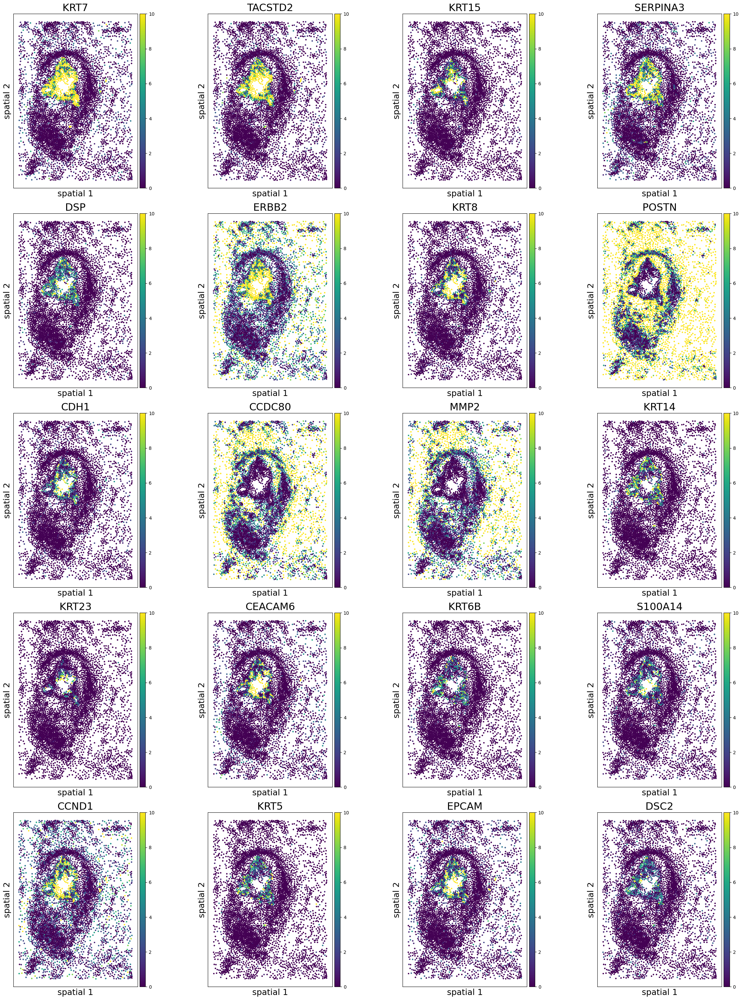

In [31]:
import matplotlib.pyplot as plt
import math
import squidpy as sq

top_genes = list(geary_df.index[0:20])

# 遺伝子数
n = len(top_genes)

# グリッドサイズ（例: 1列4つ → 4列）
n_cols = 4
n_rows = math.ceil(n / n_cols)

# Figure準備
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 6*n_rows))

# axes を1次元化（余った枠を扱いやすくする）
axes = axes.flatten()

for i, gene in enumerate(top_genes):
    ax = axes[i]

    # 各subplotに描画
    sq.pl.spatial_scatter(
        adata_subsample,
        library_id="spatial",
        color=gene,
        shape=None,
        size=15,
        img=False,
        vmin=0,
        vmax=10,
        ax=ax
    )
    
    ax.set_title(gene, fontsize=22)
    ax.set_xlabel("spatial 1", fontsize=18)
    ax.set_ylabel("spatial 2", fontsize=18)

# 残りの空白 subplot を非表示
for j in range(n, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
#plt.savefig(f"{save_root}/moran_top_distribution.png",
            #dpi=300, bbox_inches='tight')
plt.show()
